In [1]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers , models
import os
import cv2
from matplotlib import pyplot as plt
from bs4 import BeautifulSoup
import pandas as pd
from shutil import copyfile

### Dataset Preparing

In [2]:
MainPath = 'D:/Human Activity Recognition/Stanford40/'

In [3]:
selected = []
data = pd.read_csv(MainPath+'ImageSplits/actions.csv')
data.head()
selected=list(data['action_name'])

In [4]:
dir(os)

['DirEntry',
 'F_OK',
 'MutableMapping',
 'O_APPEND',
 'O_BINARY',
 'O_CREAT',
 'O_EXCL',
 'O_NOINHERIT',
 'O_RANDOM',
 'O_RDONLY',
 'O_RDWR',
 'O_SEQUENTIAL',
 'O_SHORT_LIVED',
 'O_TEMPORARY',
 'O_TEXT',
 'O_TRUNC',
 'O_WRONLY',
 'P_DETACH',
 'P_NOWAIT',
 'P_NOWAITO',
 'P_OVERLAY',
 'P_WAIT',
 'PathLike',
 'R_OK',
 'SEEK_CUR',
 'SEEK_END',
 'SEEK_SET',
 'TMP_MAX',
 'W_OK',
 'X_OK',
 '_AddedDllDirectory',
 '_Environ',
 '__all__',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__spec__',
 '_check_methods',
 '_execvpe',
 '_exists',
 '_exit',
 '_fspath',
 '_get_exports_list',
 '_putenv',
 '_unsetenv',
 '_wrap_close',
 'abc',
 'abort',
 'access',
 'add_dll_directory',
 'altsep',
 'chdir',
 'chmod',
 'close',
 'closerange',
 'cpu_count',
 'curdir',
 'defpath',
 'device_encoding',
 'devnull',
 'dup',
 'dup2',
 'environ',
 'error',
 'execl',
 'execle',
 'execlp',
 'execlpe',
 'execv',
 'execve',
 'execvp',
 'execvpe',
 'extsep',
 'fdopen

In [8]:
selected

['applauding',
 'blowing_bubbles',
 'brushing_teeth',
 'cleaning_the_floor',
 'climbing',
 'cooking',
 'cutting_trees',
 'cutting_vegetables',
 'drinking',
 'feeding_a_horse',
 'fishing',
 'fixing_a_bike',
 'fixing_a_car',
 'gardening',
 'holding_an_umbrella',
 'jumping',
 'looking_through_a_microscope',
 'looking_through_a_telescope',
 'playing_guitar',
 'playing_violin',
 'pouring_liquid',
 'pushing_a_cart',
 'reading',
 'phoning',
 'riding_a_bike',
 'riding_a_horse',
 'rowing_a_boat',
 'running',
 'shooting_an_arrow',
 'smoking',
 'taking_photos',
 'texting_message',
 'throwing_frisby',
 'using_a_computer',
 'walking_the_dog',
 'washing_dishes',
 'watching_TV',
 'waving_hands',
 'writing_on_a_board',
 'writing_on_a_book']

In [7]:
os.mkdir('D:/Human Activity Recognition/Stanford40/TrainPath')
os.mkdir('D:/Human Activity Recognition/Stanford40/TestPath')
def LoadData(path,size=150) :
    lst = {}
#     X_train = []
#     Y_train = []
#     X_test = []
#     Y_test = []
    NewPath = path + 'JPEGImages/'
    for i in os.listdir(path+'/ImageSplits') :
        for j in selected :
            #print(i)
            if j in i :
                if 'train' in i :
                    data = open(path+'/ImageSplits'+'/'+i,'r')
                    for img_path in data.readlines() :
                        lst[img_path[:-1]] = [0,selected.index(j),j]
                else :
                    data = open(path+'/ImageSplits'+'/'+i,'r')
                    for img_path in data.readlines() :
                        lst[img_path[:-1]] = [1,selected.index(j),j]
    #print(lst)
    New_Path = path + 'XMLAnnotations/'
    for i in lst :
        if lst[i][0] :
            img = cv2.imread(NewPath + i)
            da = BeautifulSoup(open(New_Path+i[:-3]+'xml','r').read(),'xml')
            xmax,xmin,ymax,ymin = da.find_all('xmax') , da.find_all('xmin') , da.find_all('ymax'), da.find_all('ymin')
            for a,b,c,d in zip(xmax,xmin,ymax,ymin) :
                if not os.path.exists('D:/Human Activity Recognition/Stanford40/TestPath/'+str(lst[i][2])) :
                    os.mkdir('D:/Human Activity Recognition/Stanford40/TestPath/'+str(lst[i][2]))
                    
                    cv2.imwrite(os.path.join('D:/Human Activity Recognition/Stanford40/TestPath/',str(lst[i][2]),str(i)),
                            cv2.resize(img[int(d.text):int(c.text),int(b.text):int(a.text)],(size,size)))
                else :
                    cv2.imwrite(os.path.join('D:/Human Activity Recognition/Stanford40/TestPath/',str(lst[i][2]),str(i)),
                            cv2.resize(img[int(d.text):int(c.text),int(b.text):int(a.text)],(size,size)))
                    
        else :
            img = cv2.imread(NewPath + i)
            da = BeautifulSoup(open(New_Path+i[:-3]+'xml','r').read(),'xml')
            xmax,xmin,ymax,ymin = da.find_all('xmax') , da.find_all('xmin') , da.find_all('ymax'), da.find_all('ymin')
            for a,b,c,d in zip(xmax,xmin,ymax,ymin) :
                if not os.path.exists('D:/Human Activity Recognition/Stanford40/TrainPath/'+str(lst[i][2])) :
                    os.mkdir('D:/Human Activity Recognition/Stanford40/TrainPath/'+str(lst[i][2]))
                    cv2.imwrite(os.path.join('D:/Human Activity Recognition/Stanford40/TrainPath/',str(lst[i][2]),str(i)),
                            cv2.resize(img[int(d.text):int(c.text),int(b.text):int(a.text)],(size,size)))
                else :
                    cv2.imwrite(os.path.join('D:/Human Activity Recognition/Stanford40/TrainPath/',str(lst[i][2]),str(i)),
                            cv2.resize(img[int(d.text):int(c.text),int(b.text):int(a.text)],(size,size)))
    print('*Done')
    #X_train , Y_train , X_test , Y_test = np.array(X_train) , np.array(Y_train) , np.array(X_test) , np.array(Y_test)
    #return X_train , Y_train , X_test , Y_test
LoadData(MainPath)

*Done


In [7]:
print(X_train.shape , Y_train.shape , X_test.shape , Y_test.shape)

(5532, 150, 150, 3) (5532,) (4000, 150, 150, 3) (4000,)


In [8]:
import pickle
fileName = 'loaded_data.pkl'
f = open(fileName, 'wb') 
pickle.dump([X_train , Y_train , X_test , Y_test],f)

In [15]:
model.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])

In [16]:
hist = model.fit(X_train,Y_train,validation_data=(X_test,Y_test),epochs=100)

Epoch 1/100
10/10 [==============================] - 3s 310ms/step - loss: 196.5497 - accuracy: 0.4726 - val_loss: 2.7256 - val_accuracy: 0.5000
Epoch 2/100
10/10 [==============================] - 2s 191ms/step - loss: 1.8126 - accuracy: 0.4932 - val_loss: 1.0248 - val_accuracy: 0.5950
Epoch 3/100
10/10 [==============================] - 2s 190ms/step - loss: 1.1421 - accuracy: 0.5753 - val_loss: 0.9393 - val_accuracy: 0.5850
Epoch 4/100
10/10 [==============================] - 2s 190ms/step - loss: 0.8332 - accuracy: 0.6096 - val_loss: 0.8787 - val_accuracy: 0.6100
Epoch 5/100
10/10 [==============================] - 2s 190ms/step - loss: 0.6477 - accuracy: 0.6952 - val_loss: 0.8698 - val_accuracy: 0.5900
Epoch 6/100
10/10 [==============================] - 2s 189ms/step - loss: 0.8151 - accuracy: 0.6952 - val_loss: 0.4957 - val_accuracy: 0.7600
Epoch 7/100
10/10 [==============================] - 2s 189ms/step - loss: 1.0669 - accuracy: 0.6712 - val_loss: 0.5104 - val_accuracy: 0.73

In [17]:
model.save('Human_Activity.h5')

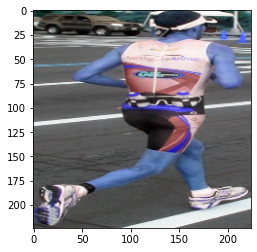

running


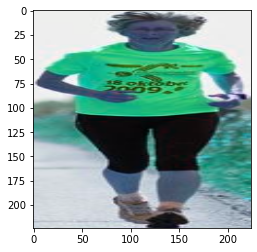

running


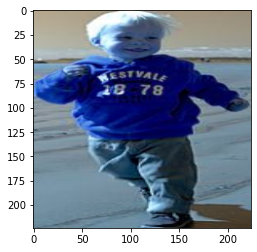

running


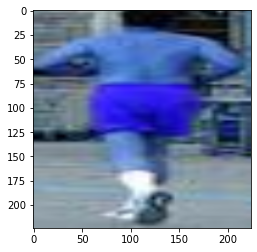

smoking


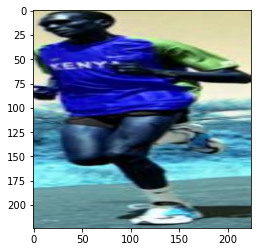

running


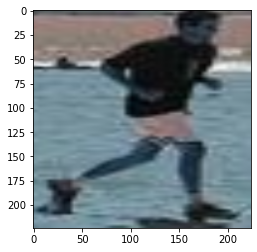

running


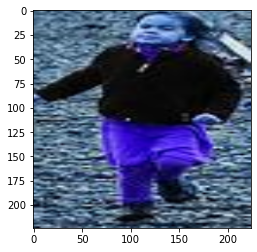

running


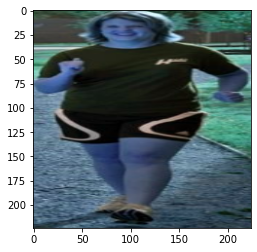

running


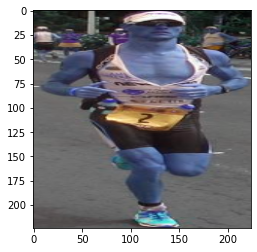

running


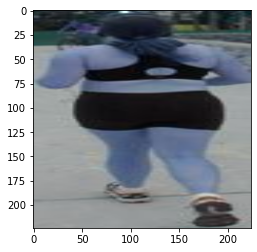

running


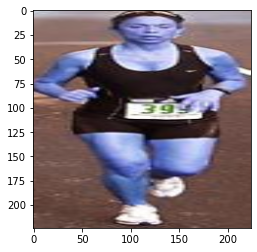

running


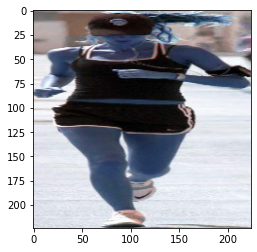

running


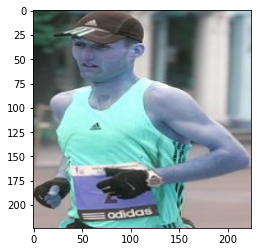

running


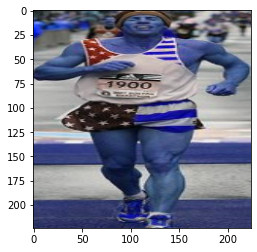

running


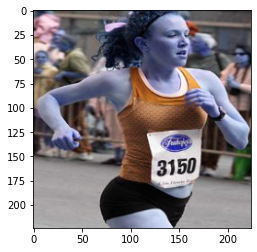

running


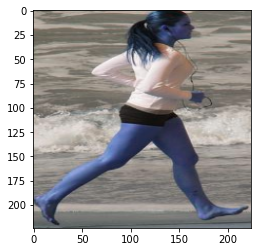

running


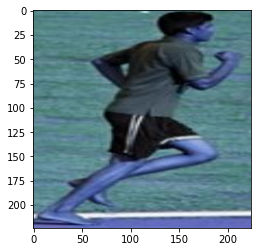

smoking


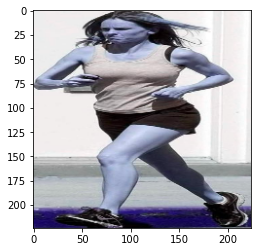

running


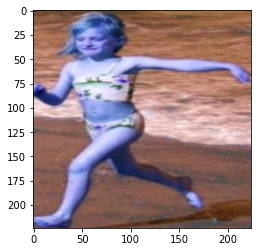

running


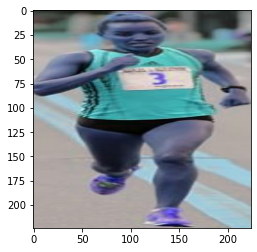

running


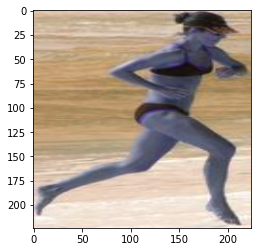

smoking


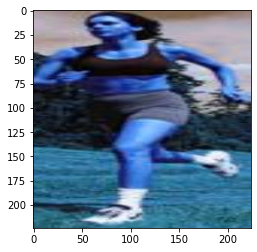

smoking


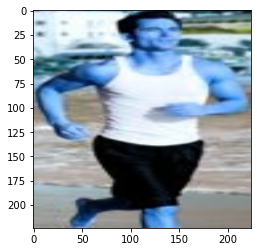

running


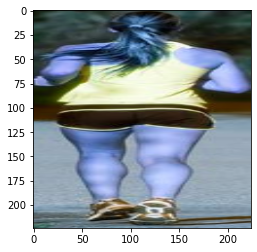

running


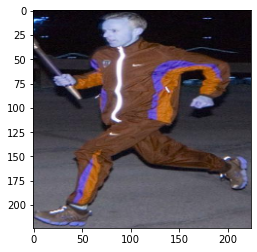

smoking


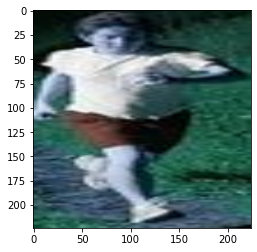

running


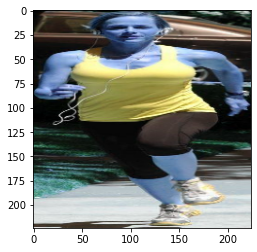

running


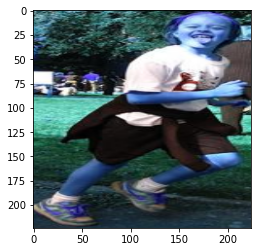

smoking


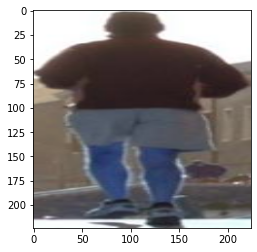

running


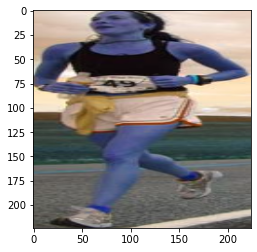

running


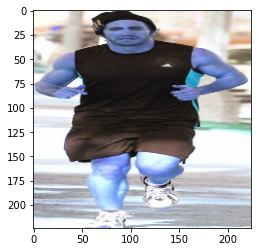

running


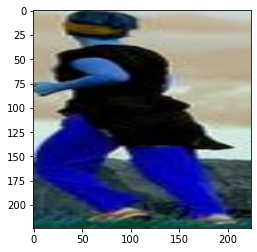

running


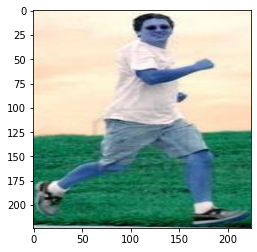

smoking


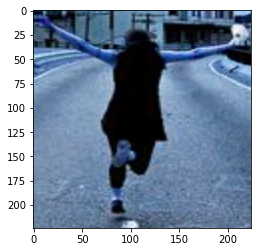

running


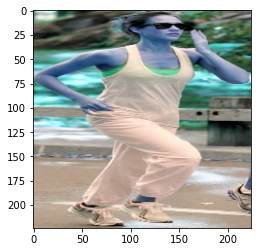

smoking


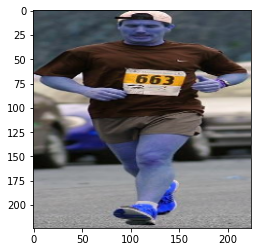

running


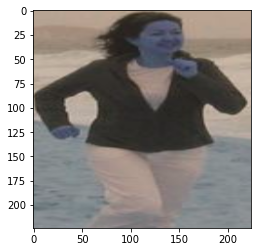

smoking


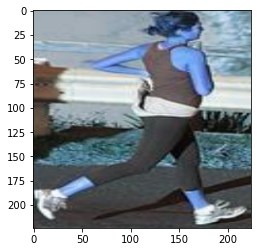

smoking


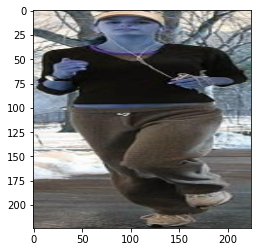

running


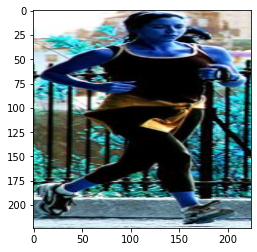

running


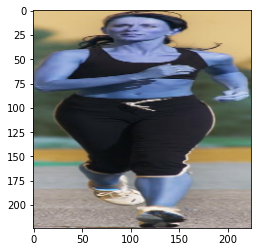

running


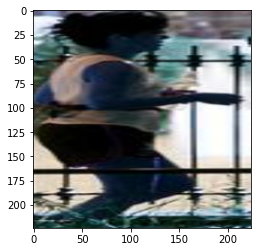

smoking


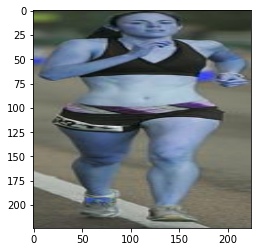

running


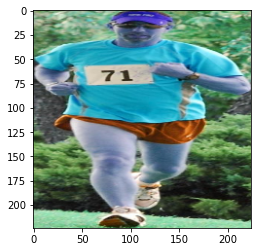

smoking


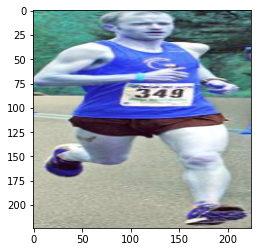

running


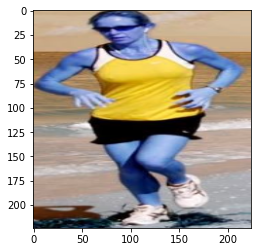

running


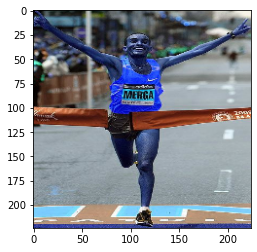

running


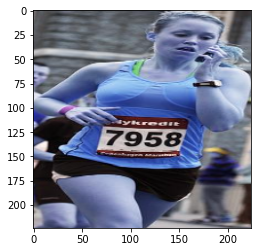

smoking


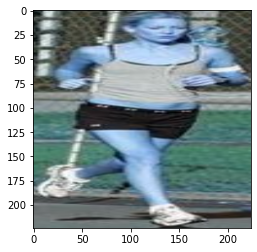

running


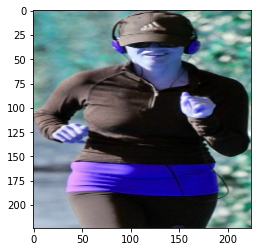

smoking


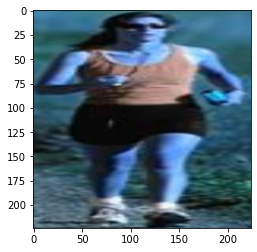

smoking


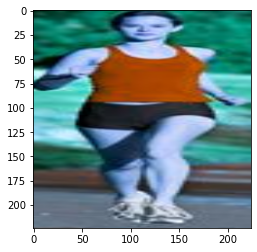

running


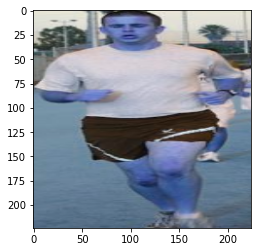

smoking


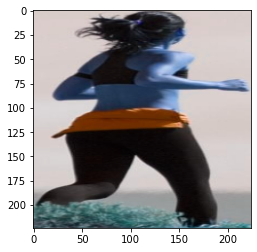

running


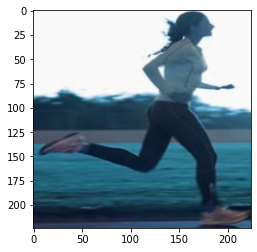

running


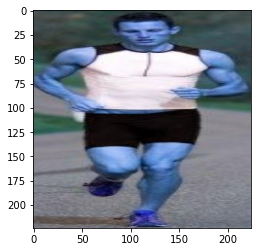

running


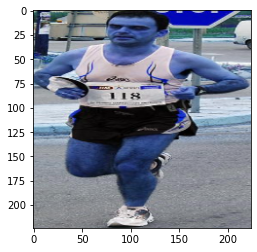

smoking


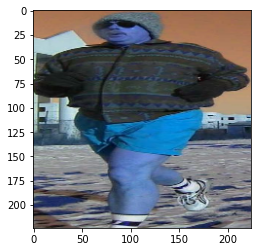

running


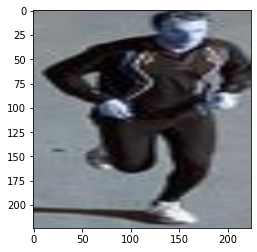

running


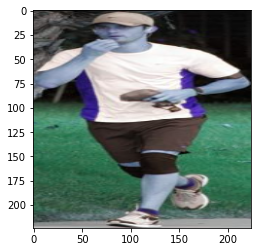

running


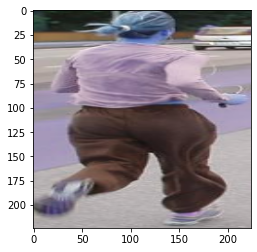

running


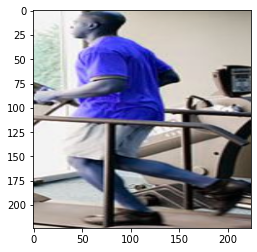

running


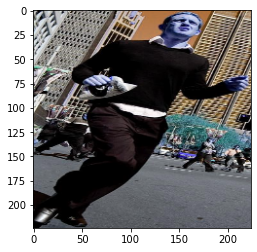

running


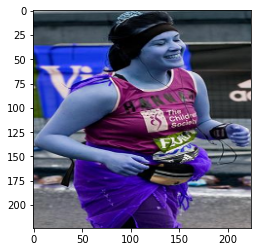

running


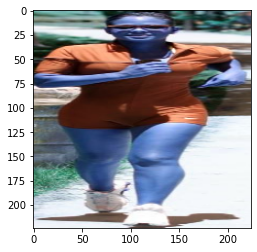

running


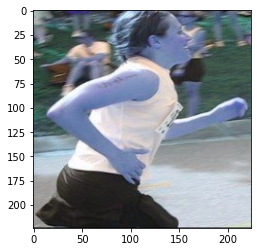

running


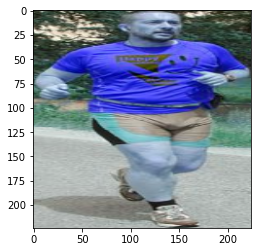

smoking


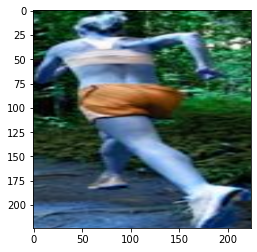

smoking


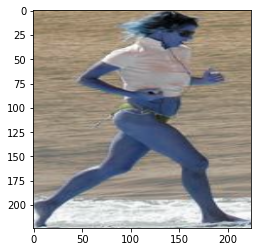

smoking


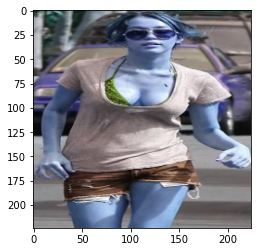

smoking


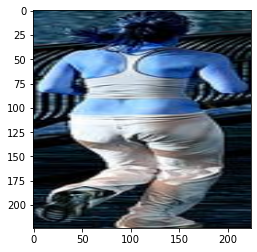

smoking


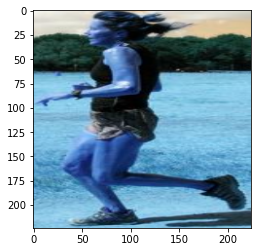

smoking


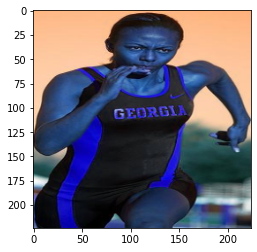

smoking


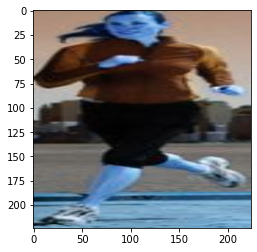

running


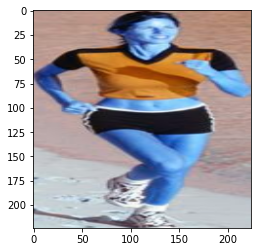

smoking


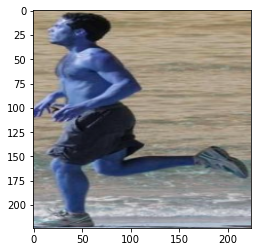

running


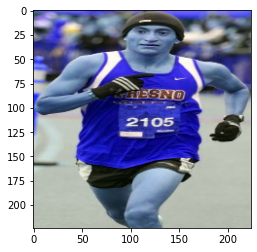

smoking


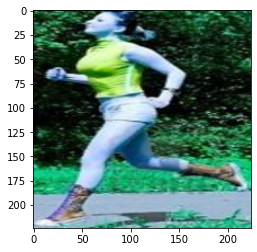

smoking


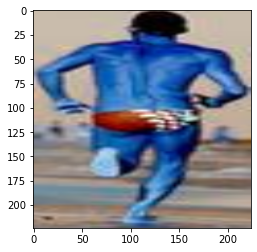

running


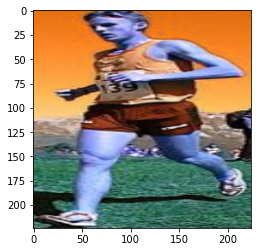

running


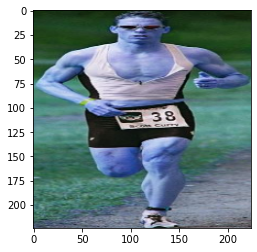

smoking


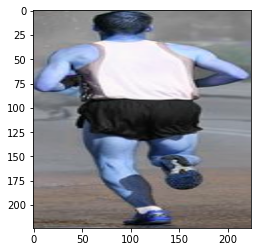

running


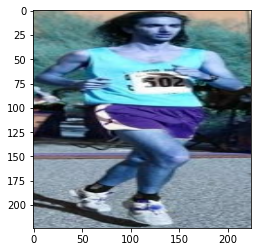

running


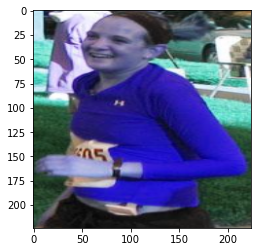

smoking


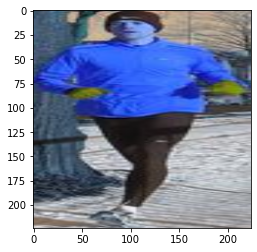

running


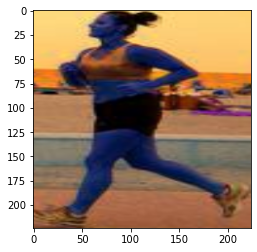

running


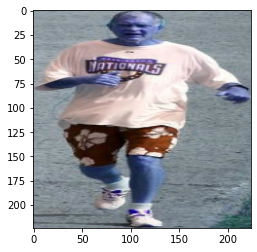

smoking


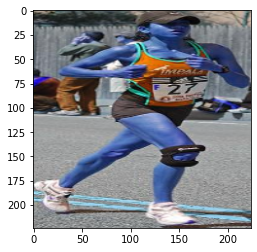

running


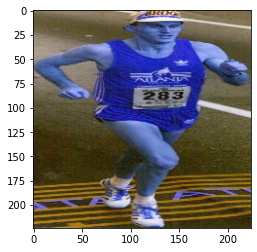

smoking


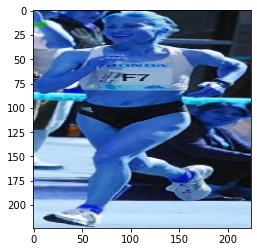

running


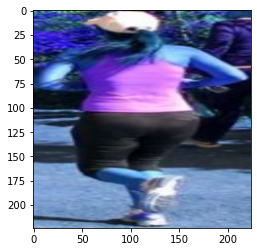

smoking


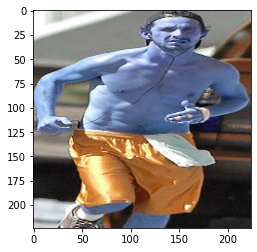

running


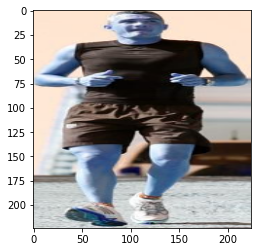

running


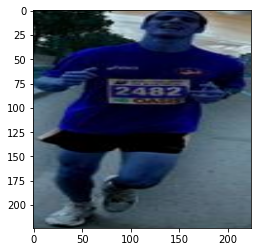

running


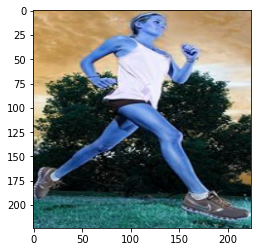

smoking


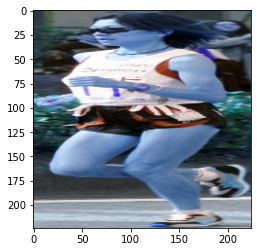

running


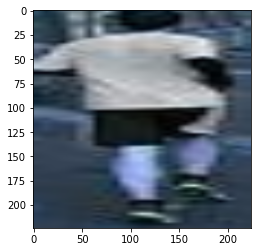

running


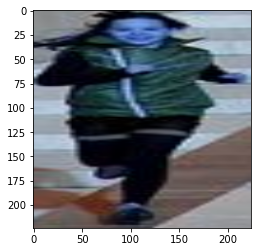

running


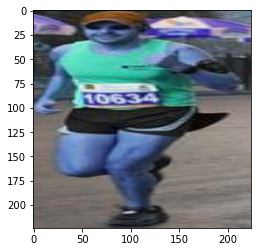

running


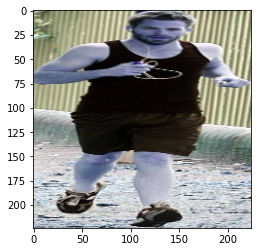

running


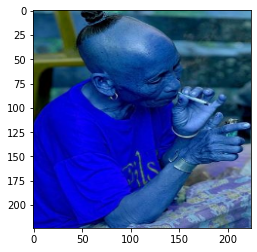

smoking


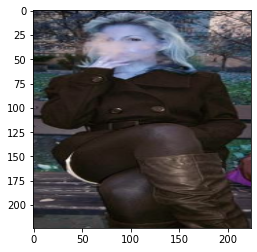

smoking


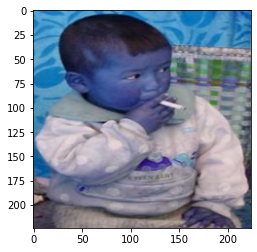

running


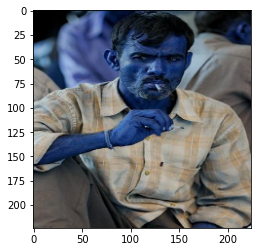

smoking


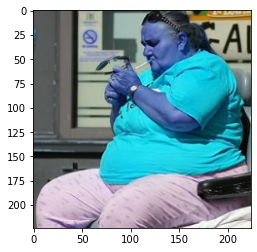

smoking


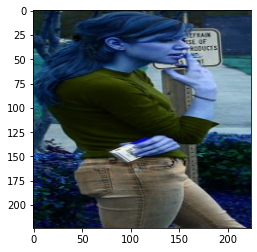

smoking


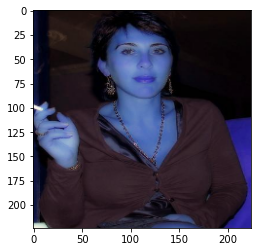

smoking


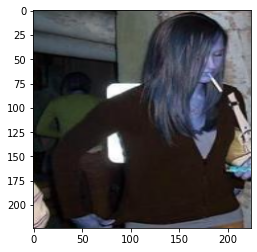

smoking


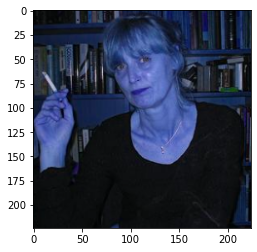

smoking


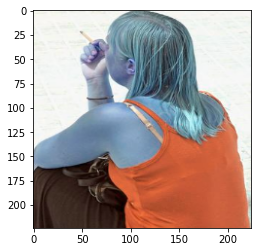

smoking


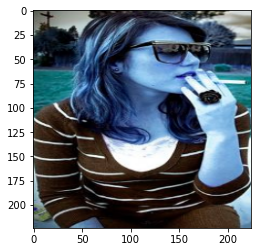

smoking


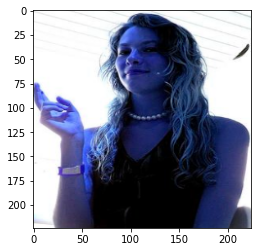

smoking


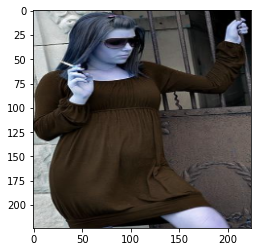

smoking


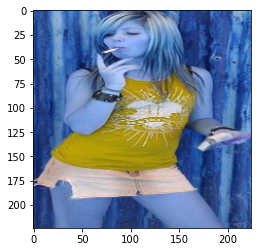

smoking


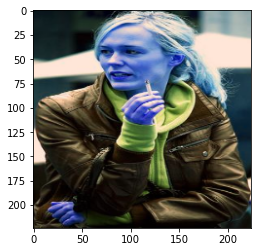

smoking


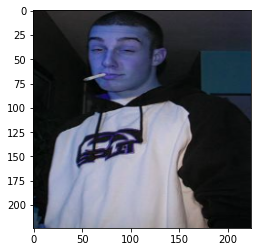

smoking


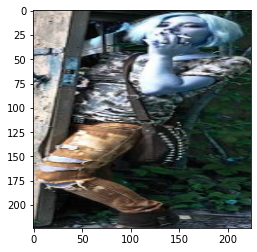

running


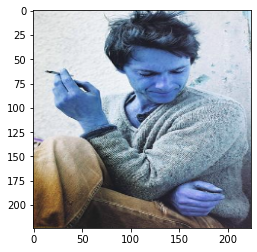

smoking


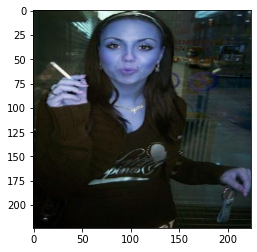

smoking


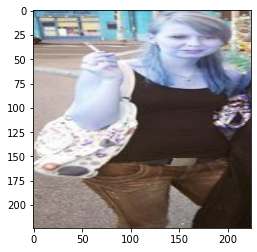

running


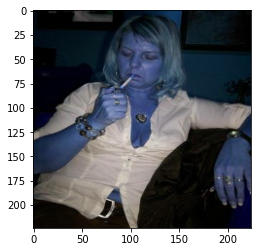

smoking


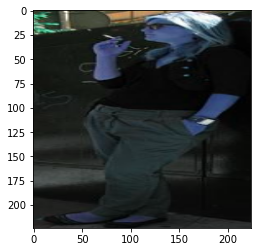

smoking


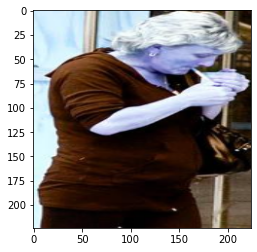

smoking


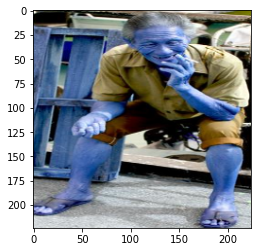

smoking


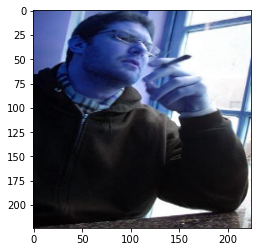

running


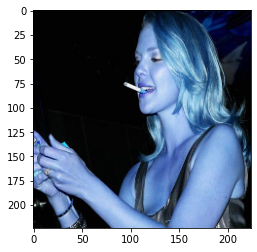

smoking


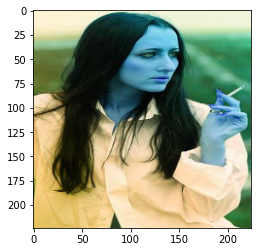

smoking


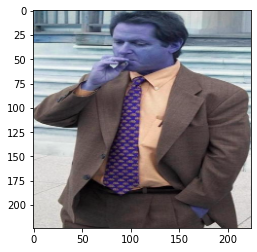

smoking


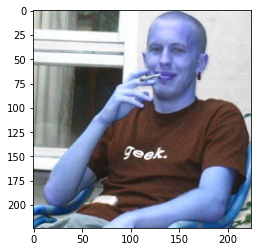

smoking


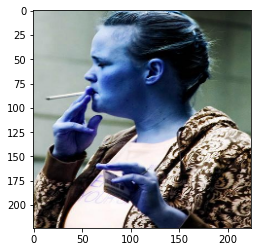

running


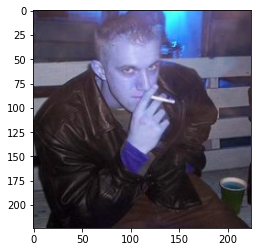

smoking


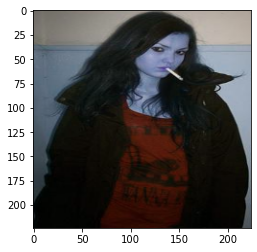

smoking


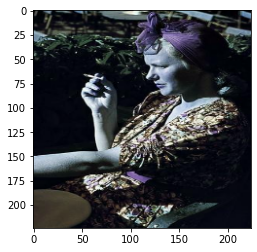

running


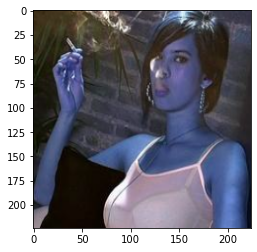

smoking


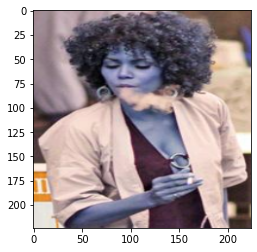

running


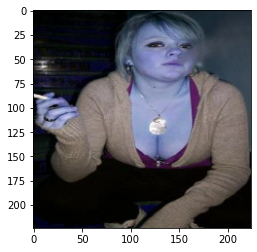

smoking


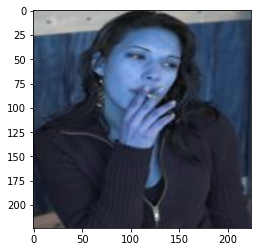

smoking


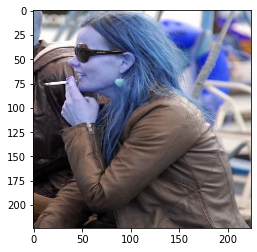

smoking


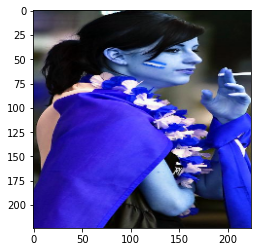

running


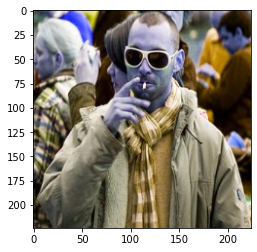

smoking


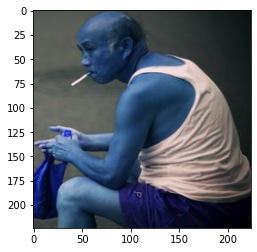

smoking


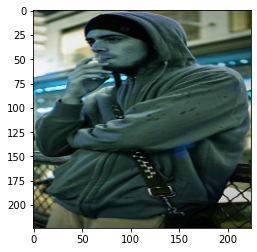

running


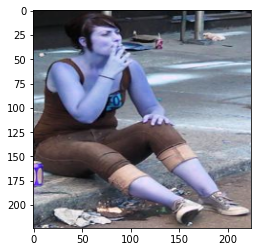

smoking


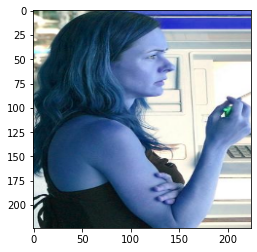

smoking


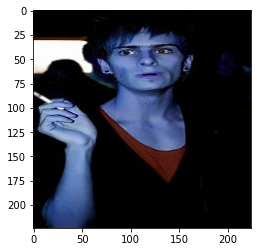

smoking


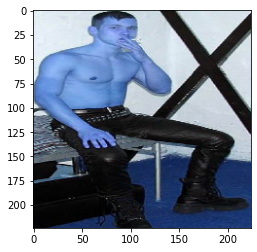

smoking


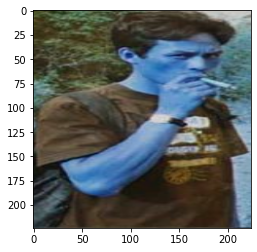

smoking


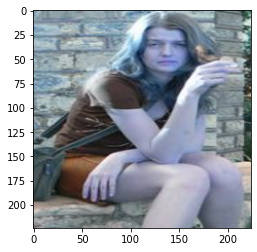

smoking


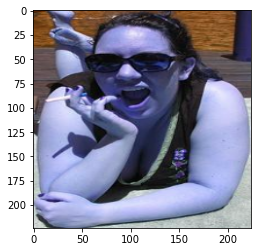

running


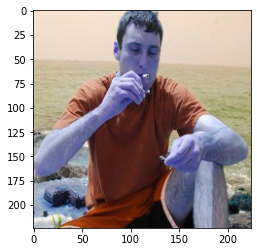

smoking


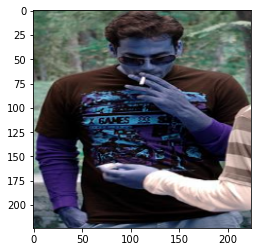

running


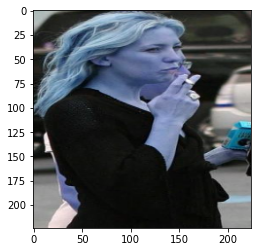

smoking


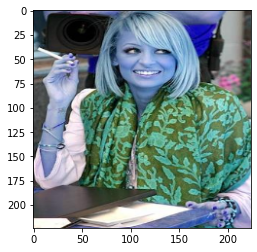

smoking


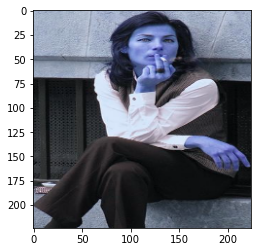

smoking


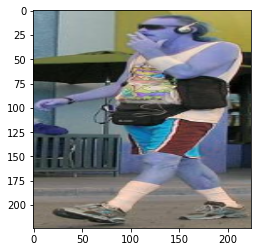

running


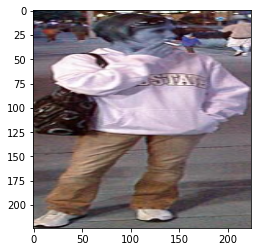

smoking


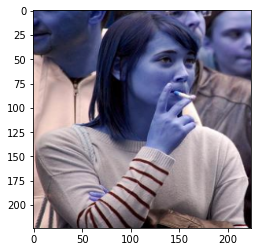

In [ ]:
for i in X_test :
    plt.imshow(i)
    plt.show()
    print(selected[model.predict_classes(np.array([i]))[0][0]])

In [12]:
X_train[0].shape

(224, 224, 3)

In [2]:
import scipy.io

In [3]:
mat = scipy.io.loadmat('YouTube_Pose_dataset_1.0/YouTube_Pose_dataset.mat')

In [4]:
dir(mat)

['__class__',
 '__contains__',
 '__delattr__',
 '__delitem__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getitem__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__iter__',
 '__le__',
 '__len__',
 '__lt__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__reversed__',
 '__setattr__',
 '__setitem__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 'clear',
 'copy',
 'fromkeys',
 'get',
 'items',
 'keys',
 'pop',
 'popitem',
 'setdefault',
 'update',
 'values']

In [5]:
mat.keys()

dict_keys(['__header__', '__version__', '__globals__', 'data'])

In [14]:
mat['data'][0][0]

(array(['https://www.youtube.com/watch?v=-osma2n86oA'], dtype='<U43'), array(['-osma2n86oA'], dtype='<U11'), array([[[195.49831989, 207.3249328 , 229.00705645, ..., 234.07560484,
         204.50907258, 225.06485215],
        [158.04737903, 135.23891129, 181.98219086, ..., 204.50907258,
         167.05813172, 177.47681452],
        [278.56619624, 274.34240591, 213.80141129, ..., 303.34576613,
         270.68178763, 257.72883065],
        ...,
        [277.72143817, 273.49764785, 258.01041667, ..., 299.12197581,
         305.88004032, 277.15826613],
        [178.6031586 , 181.1374328 , 190.99294355, ..., 209.85920699,
         180.01108871, 185.64280914],
        [254.63138441, 254.34979839, 250.40759409, ..., 278.00302419,
         252.37869624, 259.41834677]],

       [[ 81.47143817,  72.74227151,  76.96606183, ...,  81.18985215,
          77.52923387,  84.56888441],
        [122.30141129,  91.60853495,  89.07426075, ...,  84.85047043,
          89.6374328 , 180.87130376],
        [235